<a href="https://colab.research.google.com/github/Abhinay2k3/projects/blob/main/object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [89]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub
tf.get_logger().setLevel('ERROR')

In [90]:
pip install tensorflow

In [91]:
def load_image_into_numpy_array(path):
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata().reshape(1,im_height,im_width,3)).astype(np.uint8)
  ALL_MODELS ={
  'CenterNet HourGlass104 512x512':'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
  'CenterNet HourGlass104 keypoints 512x512':'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
  'CenterNet HourGlass104 1024x1024':'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
  'CenterNet HourGlass104 keypoints 1024x1024':'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
  'CenterNet Resnet50 V1 FPN 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
  'CenterNet Resnet50 V1 FPN keypints 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn512x512_kpts/1',
  'CenterNet Resnet101 V1 FPN 512x512':'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
  'CenterNet Resnet50 V2 FPN 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
  'CenterNet Resnet50 V2 FPN keypints 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
  'EfficientDet D0 512x512':'https://tfhub.dev/tensorflow/efficientdet/d0/1',
  'EfficientDet D1 640x640':'https://tfhub.dev/tensorflow/efficientdet/d1/1',
  'EfficientDet D2 768x768':'https://tfhub.dev/tensorflow/efficientdet/d2/1',
  'EfficientDet D3 896x896':'https://tfhub.dev/tensorflow/efficientdet/d3/1',
  'EfficientDet D4 1024x1024':'https://tfhub.dev/tensorflow/efficientdet/d4/1',
  'EfficientDet D5 1280x1280':'https://tfhub.dev/tensorflow/efficientdet/d5/1',
  'EfficientDet D6 1280x1280':'https://tfhub.dev/tensorflow/efficientdet/d6/1',
  'EfficientDet D7 1536x1536':'https://tfhub.dev/tensorflow/efficientdet/d7/1',
  'SSD MobileNet v2 320x320':'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
  'SSD MobileNet v1 FPN 640x640':'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
  'SSD MobileNet v2 FPNLite 320x320':'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
  'SSD MobileNet v1 FPNLite 640x640':'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
  'SSD ResNet50 v1 FPN 640x640 (RetinaNet50)':'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
  'SSD ResNet50 v1 FPN 1024x1024 (RetinaNet50)':'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
  'SSD ResNet101 v1 FPN 640x640 (RetinaNet101)':'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
  'SSD ResNet101 v1 FPN 1024x1024 (RetinaNet101)':'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
  'SSD ResNet152 v1 FPN 640x640 (RetinaNet152)':'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
  'SSD ResNet152 v1 FPN 1024x1024 (RetinaNet152)':'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
  'Faster R-CNN ResNet50 v1 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
  'Faster R-CNN ResNet50 v1 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
  'Faster R-CNN ResNet50 v1 800x1333':'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
  'Faster R-CNN ResNet101 v1 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
  'Faster R-CNN ResNet101 v1 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
  'Faster R-CNN ResNet101 v1 800x1333':'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
  'Faster R-CNN ResNet152 v1 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
  'Faster R-CNN ResNet152 v1 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
  'Faster R-CNN ResNet152 v1 800x1333':'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
  'Faster R-CNN Inception ResNet v2 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
  'Faster R-CNN Inception ResNet v2 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
  'Faster R-CNN Inception ResNet v2 800x1333':'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_800x1333/1',
  }

In [92]:
IMaGES_FOR_TEST = {
    'Beach' : 'models/research/object_detection/test_images/image2.jpg',
    'Dogs': 'models/research/object_detection/test_images/image1.jpg',
    'Naxos Taverna': 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
    'Beatles' : 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29,jpg',
    'Phones': 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
    'Birds': 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}

In [93]:
Coco17_HUMAN_POSE_KEYPOINTS = [(0,1),
(0,2),
(1,3),
(2,4),
(0,5),
(0,6),
(5,7),
(7,9),
(6,8),
(8,10),
(5,6),
(5,11),
(6,12),
(11,12),
(11,13),
(13,15),
(12,14),
(14,16)]

In [94]:
#CLONE TENSORFLOW MODELS REPOSITORY
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


Installing object Detection Api

In [95]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.12.4-1ubuntu7.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697356 sha256=3c34e2b27140c22c9616c63616e8c41c71c317a6bbff3f5f37dd2d5c9885bcd3
  Stored in directory: /tmp/pip-ephem-wheel-cache-746ix1uo/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [96]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline


label map data for plotting

In [97]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,use_display_name=True)

build a detection model and load pre traine model weights

In [98]:
#@title Model Selection { display-mode:"form", run:"auto"}

In [104]:
model_display_name = 'Faster R-CNN Inception ResNet v2 800x1333' # @param['CenterNet HourGlass104 512x512','CenterNet HourGlass104 keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN keypints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 FPN 512x512','CenterNet Resnet50 V2 FPN keypints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet v1 FPN 640x640','SSD MobileNet v2 FPNLite 320x320','SSD MobileNet v1 FPNLite 640x640','SSD ResNet50 v1 FPN 640x640 (RetinaNet50)','SSD ResNet50 v1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 v1 FPN 640x640 (RetinaNet101)','SSD ResNet101 v1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 v1 FPN 640x640 (RetinaNet152)','SSD ResNet152 v1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 v1 640x640','Faster R-CNN ResNet50 v1 1024x1024','Faster R-CNN ResNet50 v1 800x1333','Faster R-CNN ResNet101 v1 640x640','Faster R-CNN ResNet101 v1 1024x1024','Faster R-CNN ResNet101 v1 800x1333','Faster R-CNN ResNet152 v1 640x640','Faster R-CNN ResNet152 v1 1024x1024','Faster R-CNN ResNet152 v1 800x1333','Faster R-CNN Inception ResNet v2 640x640','Faster R-CNN Inception ResNet v2 1024x1024','Faster R-CNN Inception ResNet v2 800x1333']

In [105]:
ALL_MODELS = {
'CenterNet HourGlass104 512x512':'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
  'CenterNet HourGlass104 keypoints 512x512':'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
  'CenterNet HourGlass104 1024x1024':'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
  'CenterNet HourGlass104 keypoints 1024x1024':'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
  'CenterNet Resnet50 V1 FPN 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
  'CenterNet Resnet50 V1 FPN keypints 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn512x512_kpts/1',
  'CenterNet Resnet101 V1 FPN 512x512':'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
  'CenterNet Resnet50 V2 FPN 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
  'CenterNet Resnet50 V2 FPN keypints 512x512':'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
  'EfficientDet D0 512x512':'https://tfhub.dev/tensorflow/efficientdet/d0/1',
  'EfficientDet D1 640x640':'https://tfhub.dev/tensorflow/efficientdet/d1/1',
  'EfficientDet D2 768x768':'https://tfhub.dev/tensorflow/efficientdet/d2/1',
  'EfficientDet D3 896x896':'https://tfhub.dev/tensorflow/efficientdet/d3/1',
  'EfficientDet D4 1024x1024':'https://tfhub.dev/tensorflow/efficientdet/d4/1',
  'EfficientDet D5 1280x1280':'https://tfhub.dev/tensorflow/efficientdet/d5/1',
  'EfficientDet D6 1280x1280':'https://tfhub.dev/tensorflow/efficientdet/d6/1',
  'EfficientDet D7 1536x1536':'https://tfhub.dev/tensorflow/efficientdet/d7/1',
  'SSD MobileNet v2 320x320':'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
  'SSD MobileNet v1 FPN 640x640':'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
  'SSD MobileNet v2 FPNLite 320x320':'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
  'SSD MobileNet v1 FPNLite 640x640':'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
  'SSD ResNet50 v1 FPN 640x640 (RetinaNet50)':'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
  'SSD ResNet50 v1 FPN 1024x1024 (RetinaNet50)':'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
  'SSD ResNet101 v1 FPN 640x640 (RetinaNet101)':'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
  'SSD ResNet101 v1 FPN 1024x1024 (RetinaNet101)':'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
  'SSD ResNet152 v1 FPN 640x640 (RetinaNet152)':'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
  'SSD ResNet152 v1 FPN 1024x1024 (RetinaNet152)':'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
  'Faster R-CNN ResNet50 v1 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
  'Faster R-CNN ResNet50 v1 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
  'Faster R-CNN ResNet50 v1 800x1333':'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
  'Faster R-CNN ResNet101 v1 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
  'Faster R-CNN ResNet101 v1 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
  'Faster R-CNN ResNet101 v1 800x1333':'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
  'Faster R-CNN ResNet152 v1 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
  'Faster R-CNN ResNet152 v1 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
  'Faster R-CNN ResNet152 v1 800x1333':'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
  'Faster R-CNN Inception ResNet v2 640x640':'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
  'Faster R-CNN Inception ResNet v2 1024x1024':'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
  'Faster R-CNN Inception ResNet v2 800x1333':'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_800x1333/1',
}
model_handle = ALL_MODELS[model_display_name]


In [106]:
print('Selecte model:'+ model_display_name)

Selecte model:Faster R-CNN Inception ResNet v2 800x1333


In [107]:
print('Model Handle at TensorFlow Hub: {}'.format(model_handle))

Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_800x1333/1


loading the selected model from TensorFlow Hub

In [118]:
print('loading model...')
model_handle = 'https://tfhub.dev/tensorflow/efficientdet/d7/1'
hub_model = hub.load(model_handle)
print('model loaded')

loading model...


model loaded


Loading an image

In [119]:
#@title Image Selection (don't forget to execute the cell!) { display-mode: "form" }
selected_image = 'Birds' # @param['Beach','Dogs','Naxos Taverna', 'Beatles','Phones','Birds']
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}
IMAGES_FOR_TEST = {
    'Beach': 'models/research/object_detection/test_images/image2.jpg',
    'Dogs': 'models/research/object_detection/test_images/image1.jpg',
    'Naxos Taverna': 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
    'Beatles': 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29,jpg',
    'Phones': 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
    'Birds': 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}
def load_image_into_numpy_array(path):
    image = None
    if path.startswith('http'):
        response = urlopen(path)
        image_data = response.read()
        image_data = BytesIO(image_data)
        image = Image.open(image_data)
    else:
        image_data = tf.io.gfile.GFile(path, 'rb').read()
        image = Image.open(BytesIO(image_data))

    return np.array(image).astype(np.uint8)

# ... (rest of your code)

image_path = IMAGES_FOR_TEST[selected_image]
image_np = load_image_into_numpy_array(image_path)

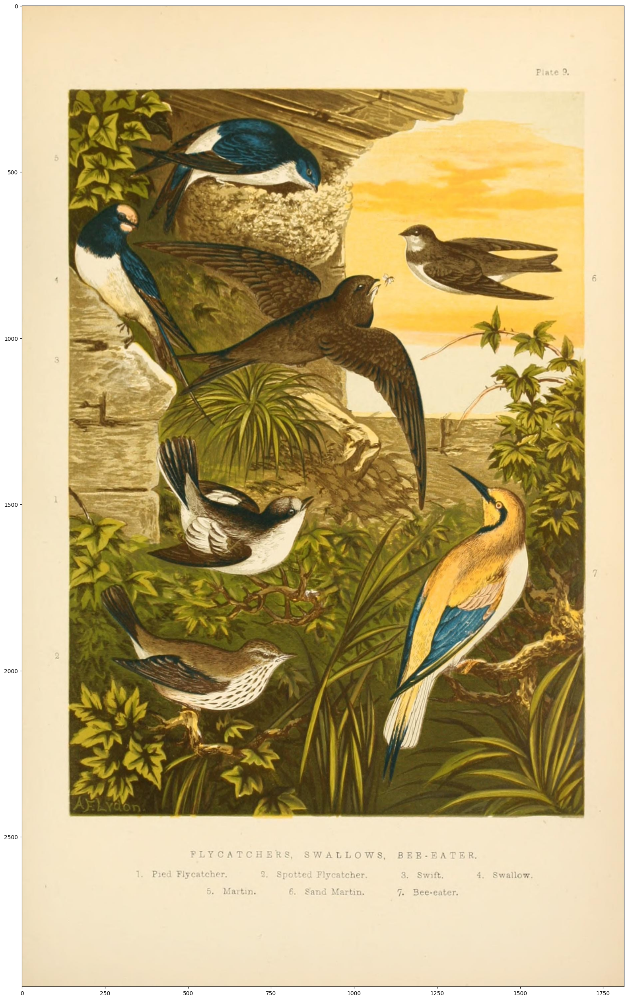

dict_keys(['detection_classes', 'detection_anchor_indices', 'detection_scores', 'detection_multiclass_scores', 'raw_detection_boxes', 'detection_boxes', 'raw_detection_scores', 'num_detections'])


In [120]:
# Reshape the input tensor to match the expected shape
image_np = image_np.reshape((1, image_np.shape[0], image_np.shape[1], image_np.shape[2]))

# Rest of your code remains unchanged
if flip_image_horizontally:
    image_np[0] = np.fliplr(image_np[0].copy())

if convert_image_to_grayscale:
    image_np[0] = np.tile(
        np.mean(image_np[0], axis=2, keepdims=True), (1, 1, 3)).astype(np.uint8)

plt.figure(figsize=(24, 32))
plt.imshow(image_np[0])
plt.show()

results = hub_model(image_np)
result = {key: value.numpy() for key, value in results.items()}
print(result.keys())


In [121]:
results = hub_model(image_np)
result = {key: value.numpy() for key, value in results.items()}
print(result.keys())

dict_keys(['detection_classes', 'detection_anchor_indices', 'detection_scores', 'detection_multiclass_scores', 'raw_detection_boxes', 'detection_boxes', 'raw_detection_scores', 'num_detections'])


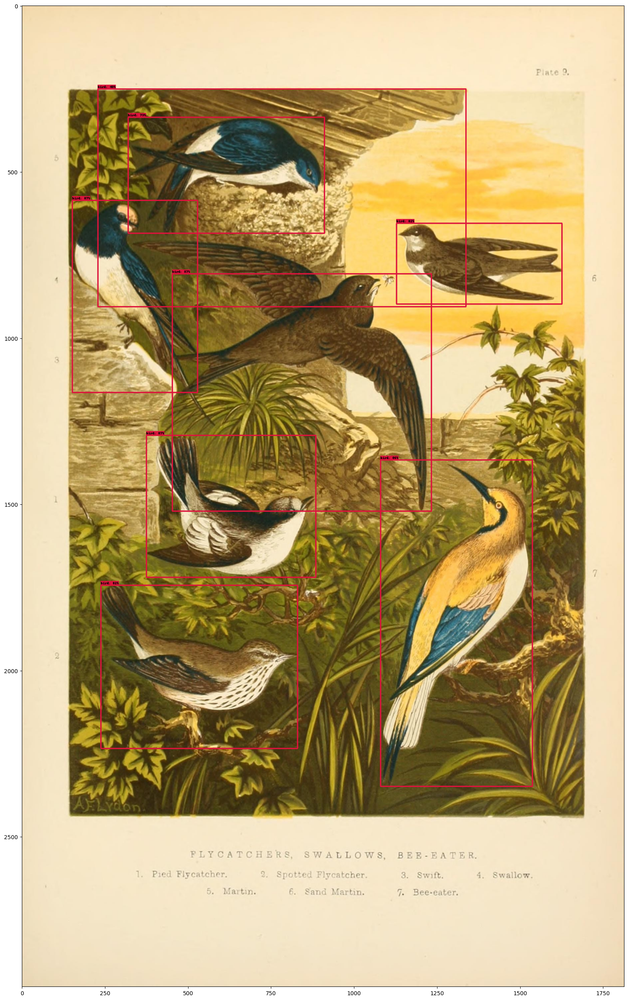

In [122]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Keypoints if available detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
    keypoints = result['detection_keypoints'][0]
    keypoint_scores = result['detection_keypoints_scores'][0]

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections[0],
    result['detection_boxes'][0],
    (result['detection_classes'][0] + label_id_offset).astype(int),
    result['detection_scores'][0],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=200,
    min_score_thresh=.30,
    agnostic_mode=False,
    keypoints=keypoints,
    keypoint_scores=keypoint_scores,
    keypoint_edges=None  # Change this line to use default edges
)

plt.figure(figsize=(24, 32))
plt.imshow(image_np_with_detections[0])
plt.show()


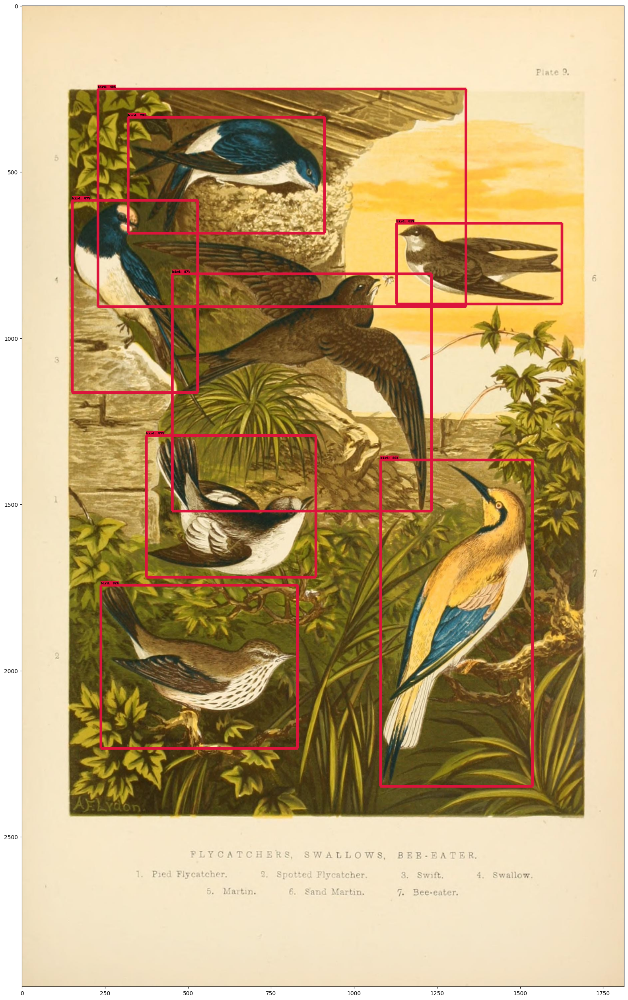

In [123]:
image_np_with_mask = image_np.copy()

if 'detection_masks' in result:
    detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
    detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
        detection_masks, detection_boxes,
        image_np.shape[1], image_np.shape[2])

    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5, tf.uint8)

    # Ensure the masks have the right shape
    detection_masks_reframed = detection_masks_reframed.numpy()
    detection_masks_reframed = np.expand_dims(detection_masks_reframed, axis=-1)

    result['detection_masks_reframed'] = detection_masks_reframed

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_mask[0],
    result['detection_boxes'][0],
    (result['detection_classes'][0] + label_id_offset).astype(int),
    result['detection_scores'][0],
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=200,
    min_score_thresh=.30,
    agnostic_mode=False,
    instance_masks=result.get('detection_masks_reframed', None),
    line_thickness=8
)

plt.figure(figsize=(24, 32))
plt.imshow(image_np_with_mask[0])
plt.show()


In [127]:
# Example ground truth and predicted bounding boxes
ground_truth_boxes = [[10, 20, 50, 60], [30, 40, 70, 80], [15, 25, 45, 65]]
predicted_boxes = [[12, 22, 52, 62], [28, 38, 68, 78], [10, 20, 50, 60]]

# Function to calculate IoU
def calculate_iou(box1, box2):
    intersect_ymin = max(box1[0], box2[0])
    intersect_xmin = max(box1[1], box2[1])
    intersect_ymax = min(box1[2], box2[2])
    intersect_xmax = min(box1[3], box2[3])

    intersect_area = max(0, intersect_ymax - intersect_ymin) * max(0, intersect_xmax - intersect_xmin)

    area_box1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area_box2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = area_box1 + area_box2 - intersect_area

    epsilon = 1e-5
    iou = intersect_area / max(union_area, epsilon)
    return iou

# Calculate IoU scores for each pair of boxes
iou_scores = [calculate_iou(gt_box, pred_box) for gt_box, pred_box in zip(ground_truth_boxes, predicted_boxes)]

print("IoU Scores:", iou_scores)


IoU Scores: [0.8223234624145785, 0.8223234624145785, 0.6]
